#### Flow of image stiching

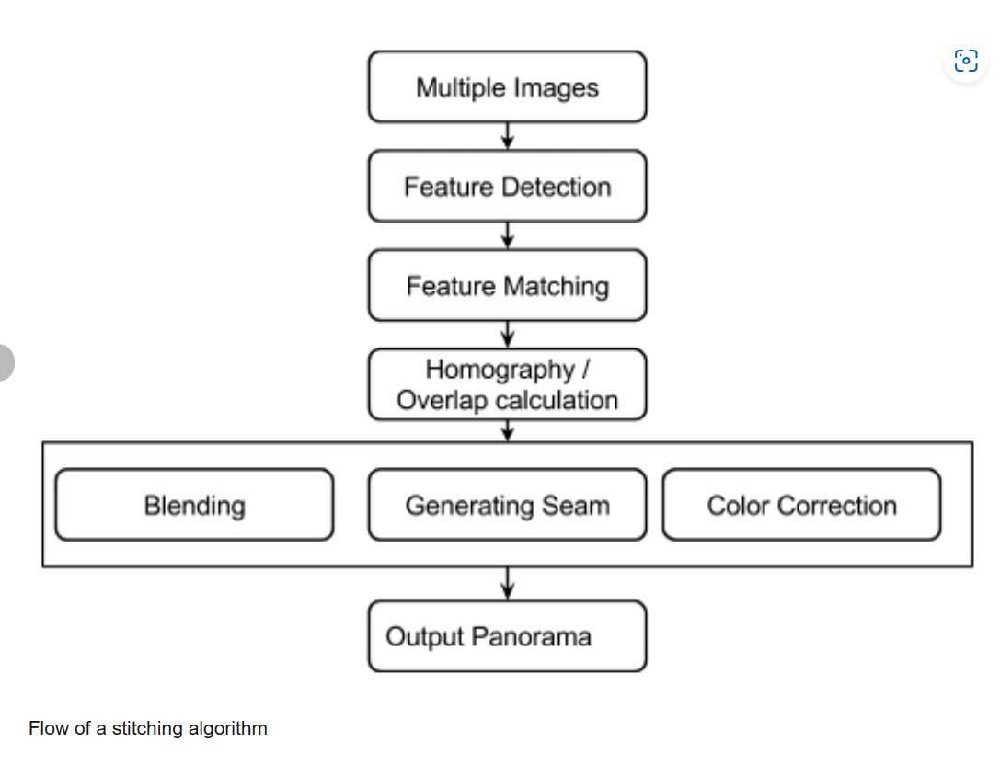

**feature detection**:  SIFT(Scale-invariant feature transform) is applied to each image in the set to extract a set of keypoints that represent distinctive features in the image

**feature mathcing**: The set of keypoints and their descriptors from each image are matched to find corresponding features between overlapping regions of the images. SIFT matches keypoints between images based on the similarity of their feature descriptors

#### SIFT

The name SIFT comes from the fact (Scale-Invariant Feature Transform) that the algorithm works by identifying keypoints in an image that are stable across different scales and orientations 

Constructing a Scale Space: To make sure that features are scale-independent

Keypoint Localisation: Identifying the suitable features or keypoints

Orientation Assignment: Ensure the keypoints are rotation invariant

Keypoint Descriptor: Assign a unique fingerprint to each keypoint

##### Steps

Both **Gaussian blurring** and reducing the resolution of the image can help in reducing high-frequency information in an image.

Gaussian blurring can help to preserve the overall structure of the image while reducing noise and other high-frequency components which is not the case when we downscale.

The first step is to create a scale space representation of the input image by applying a Gaussian filter 

The scale space is then used to generate the DoG images by subtracting the neighboring scale images at each level of the scale space pyramid. The resulting DoG images capture the difference in Gaussian filter responses at adjacent scales.

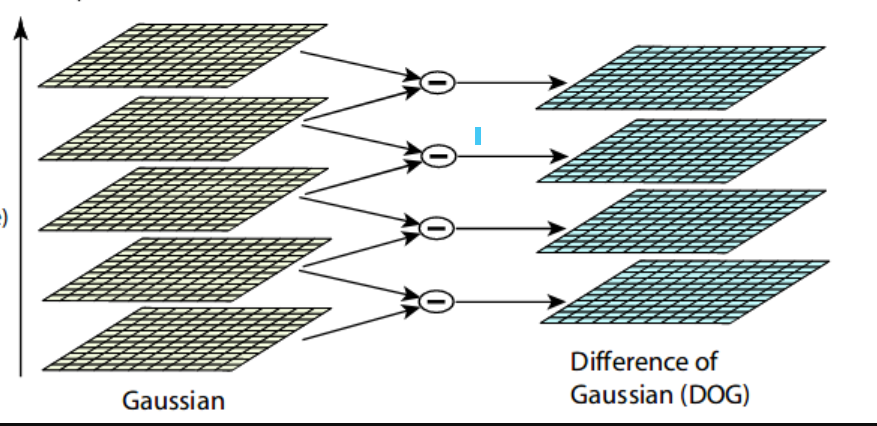

**Why do we need difference between adacent gaussain responses?**

By subtracting one Gaussian-filtered image from another at different scales, we obtain a difference image that highlights the high-frequency information that was removed by the Gaussian filter. This high-frequency information corresponds to the edges and features in the image.

It basically tells us the features which are salient through out scale change.

**Find potential keypoints**: The next step is to find potential keypoints in the DoG scale space. This is done by identifying the local extrema in each DoG image. A local extrema is defined as a pixel whose intensity is greater than or less than all of its 26 neighbors in the current and adjacent scales.Then refine the key points even more using some kind of threshold

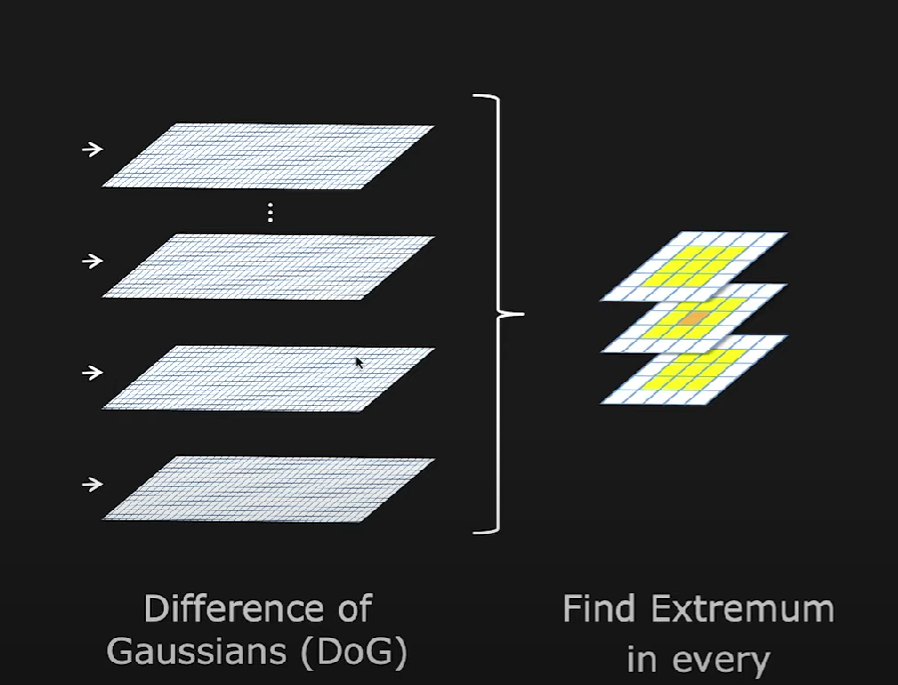


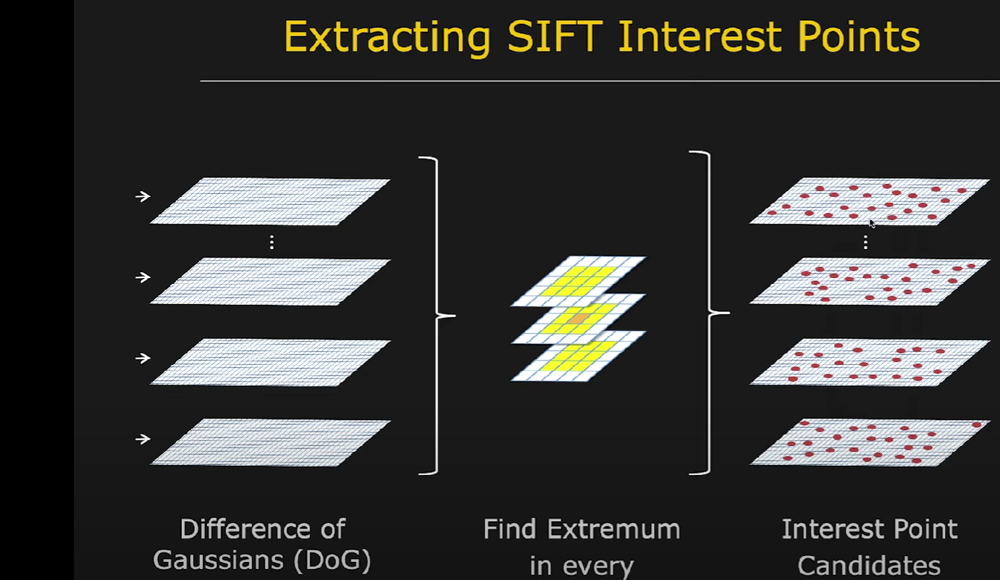


**The next step is to assign an orientation to each keypoint**. 
This is done by computing the gradient magnitude and direction of the image at each keypoint location
and creating a histogram of the gradient orientations in a local neighborhood around the keypoint.Construct a histogram of gradient orientations for the pixels
in a circular window around the keypoint.

The dominant orientation in the histogram is assigned as the orientation of the keypoint.

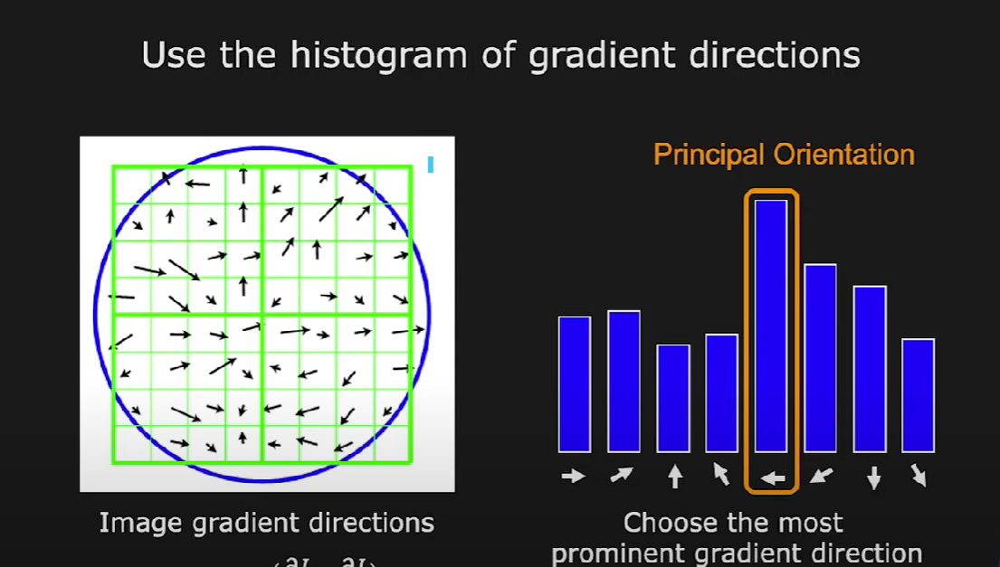

**Keypoint Descriptor**
This is the final step for SIFT.In this section, we will use the neighboring pixels, their orientations, and their magnitude to generate a unique fingerprint for this keypoint called a ‘descriptor’.
The SIFT algorithm computes a descriptor vector that summarizes the local image structure around the keypoint. 

The descriptor is computed by dividing the local image region into sub-regions, computing a histogram of gradient orientations and magnitudes for each sub-region, and concatenating these histograms into a final descriptor vector.

The descriptor captures information about the distribution of gradient orientations and magnitudes in a region around the keypoint.

These descriptors are used to match keypoints across different images.

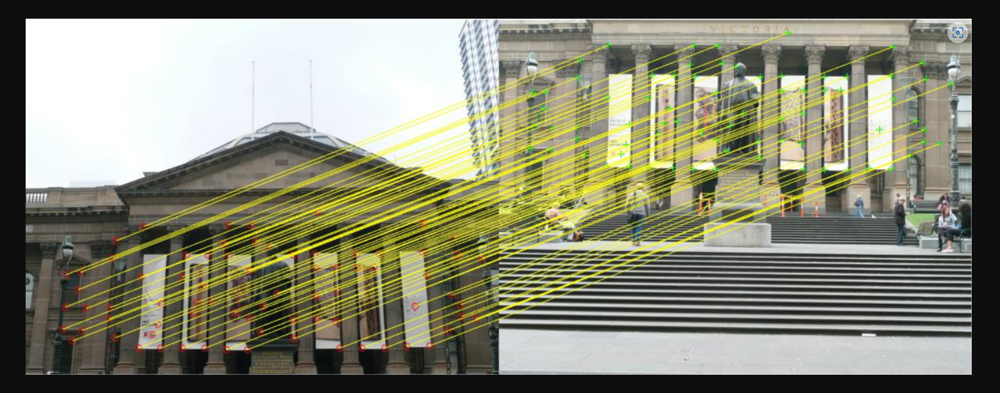

#### Homographic transformation

We estimate the transformation matrix (homography) that relates the pixels of one image to another using the matched feature points/key points.

Learning about homographic transformation is essential for image stitching because it is the mathematical model used to relate 
the pixels of one image to another in a common coordinate system (Image warping refers to the process of transforming an image to a different coordinate system,
based on a given transformation model)

This allows for smooth transitions between images and creates a seamless, wide-angle view of the scene. 




#### RANSAC

When matching features between images, there may be some mismatches due to lighting changes, occlusions, or other factors. These mismatches can lead to incorrect estimates of the homography and ultimately result in poor image stitching. RANSAC is used to eliminate the effect of these incorrect matches by randomly sampling a subset of feature matches and estimating the homography based on this subset

step 1 : Randomly select a minimum number of feature point matches and estimate the transformation (homography) between the two images using these matches.

step 2 : Use the transformation model to project all the points from one image to the other, and compute the error between the projected points and the actual points. 

step 3 : Count the number of matches that have an error below a threshold.These matches are considered inliers and are likely to be correctly matched.

step 4 : Repeat steps a large number of times , each time choosing a different subset of matches. Keep track of the transformation model that had the most inliers.

That is it , this is our best transformation. after this doing normal warping.

*Inliers are the feature points that are considered to be correctly matched by the transformation model.*

In [24]:
import cv2
import numpy as np
import sys

import cv2
import numpy as np

class Image_Stitching:
    def __init__(self, ratio_threshold=0.85, min_match_count=10, smoothing_window_size=800):
        
        self.ratio_threshold = ratio_threshold
        self.min_match_count = min_match_count
        self.smoothing_window_size = smoothing_window_size
        self.sift = cv2.xfeatures2d.SIFT_create()

    def registration(self, image1, image2):
        
        # Detecting SIFT keypoints and descriptors in both images
        keypoints1, descriptors1 = self.sift.detectAndCompute(image1, None)
        keypoints2, descriptors2 = self.sift.detectAndCompute(image2, None)

        # Matching keypoints between images using the Brute-Force Matcher
        matcher = cv2.BFMatcher()
        raw_matches = matcher.knnMatch(descriptors1, descriptors2, k=2)

        # Filtering out ambiguous matches using the ratio test
        good_points = []
        good_matches=[]
        for match1, match2 in raw_matches:
            if match1.distance < self.ratio_threshold * match2.distance:
                good_points.append((match1.trainIdx, match1.queryIdx))
                good_matches.append([match1])

        #Saving the plot of the image with matches 
        img3 = cv2.drawMatchesKnn(image1, keypoints1, image2, keypoints2, good_matches, None, flags=2)
        cv2.imwrite('matching.jpg', img3)

        # Estimating homography matrix using RANSAC algorithm
        if len(good_points) >= self.min_match_count:
            keypoints1 = np.float32([keypoints1[i].pt for (_, i) in good_points])
            keypoints2 = np.float32([keypoints2[i].pt for (i, _) in good_points])
            H, status = cv2.findHomography(keypoints2, keypoints1, cv2.RANSAC, 5.0)
            return H
        else:
            raise ValueError("Not enough good matches to estimate homography matrix.")

    def create_mask(self, img1, img2, version):
      
      height_img1, width_img1 = img1.shape[:2]
      width_img2 = img2.shape[1]
      height_panorama = height_img1
      width_panorama = width_img1 + width_img2
      offset = int(self.smoothing_window_size / 2)
      barrier = img1.shape[1] - int(self.smoothing_window_size / 2)

      mask = np.zeros((height_panorama, width_panorama))
      if version == 'left_image':
          # Creating a linear gradient mask that emphasizes the left image
          mask[:, barrier - offset:barrier + offset] = np.tile(np.linspace(1, 0, 2 * offset).T, (height_panorama, 1))
          mask[:, :barrier - offset] = 1
      else:
          # Creating a linear gradient mask that emphasizes the right image
          mask[:, barrier - offset:barrier + offset] = np.tile(np.linspace(0, 1, 2 * offset).T, (height_panorama, 1))
          mask[:, barrier + offset:] = 1

      # Merging the mask with itself 3 times to create a 3-channel mask
      return cv2.merge([mask, mask, mask])

    def blending(self, img1, img2):
      
        # Calculatig the homography matrix to register the two images
        H = self.registration(img1, img2)

        # Computing the dimensions of the panorama
        height_img1, width_img1 = img1.shape[:2]
        width_img2 = img2.shape[1]
        height_panorama = height_img1
        width_panorama = width_img1 + width_img2

        # Initializing a black panorama and create masks for each image
        panorama1 = np.zeros((height_panorama, width_panorama, 3))
        mask1 = self.create_mask(img1, img2, version='left_image')
        panorama1[0:img1.shape[0], 0:img1.shape[1], :] = img1
        panorama1 *= mask1
        mask2 = self.create_mask(img1, img2, version='right_image')

        # Transforming the second image using the homography matrix and applying the mask
        panorama2 = cv2.warpPerspective(img2, H, (width_panorama, height_panorama)) * mask2

        # Adding the two panoramas together and crop the result
        result = panorama1 + panorama2
        rows, cols = np.where(result[:, :, 0] != 0)
        min_row, max_row = min(rows), max(rows) + 1
        min_col, max_col = min(cols), max(cols) + 1
        final_result = result[min_row:max_row, min_col:max_col, :]

        return final_result

def main(argv1,argv2):
      img1 = cv2.imread(argv1)
      img2 = cv2.imread(argv2)
      final=Image_Stitching().blending(img1,img2)
      cv2.imwrite('panorama.jpg', final)

In [25]:
 main('/content/q11.jpg',"/content/q22.jpg")

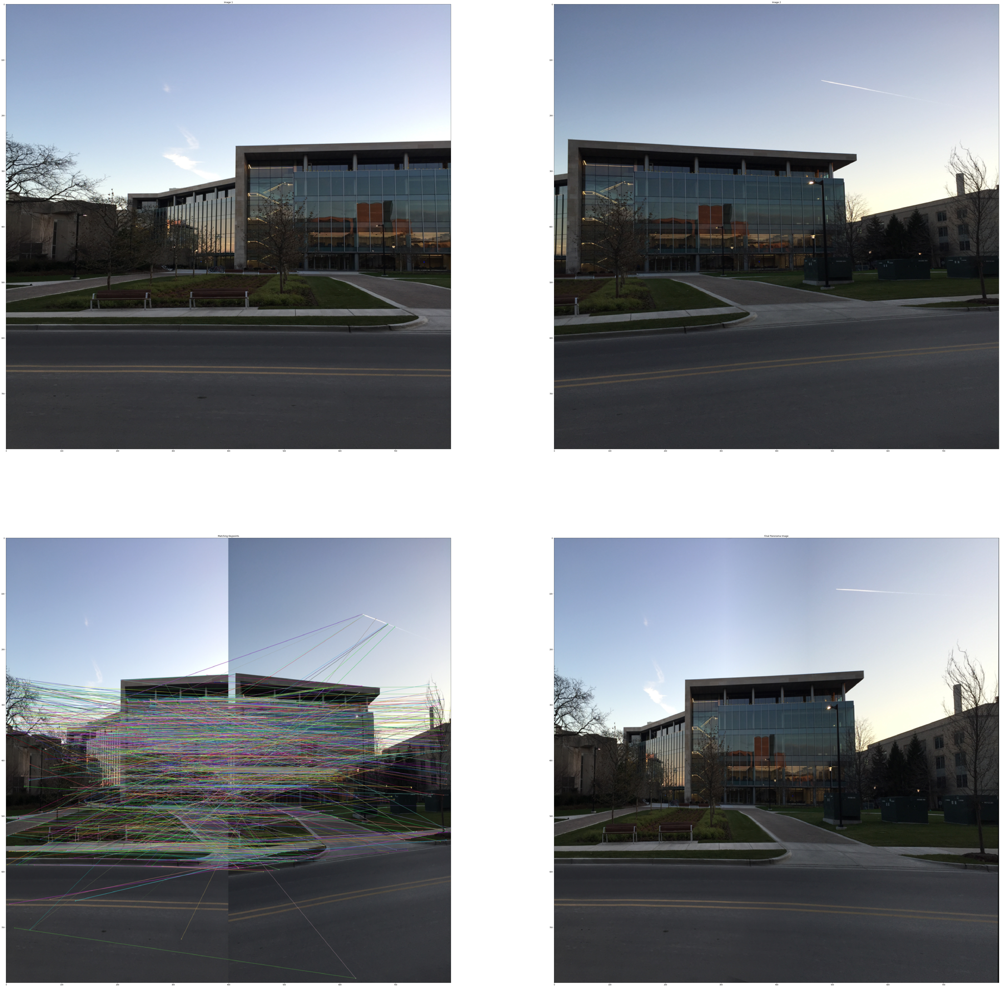

In [28]:
import matplotlib.pyplot as plt
from PIL import Image

image_paths = ['/content/q11.jpg', '/content/q22.jpg', '/content/matching.jpg', '/content/panorama.jpg']

images = []
for path in image_paths:
    images.append(Image.open(path).resize((800, 800)))

# Creatimg a figure with 4 subplots to display the images
fig, ax = plt.subplots(nrows=2, ncols=2, figsize=(100, 100))

ax[0, 0].imshow(images[0])
ax[0, 0].set_title('Image 1')

ax[0, 1].imshow(images[1])
ax[0, 1].set_title('Image 2')

ax[1, 0].imshow(images[2])
ax[1, 0].set_title('Matching Keypoints')

ax[1, 1].imshow(images[3])
ax[1, 1].set_title('Final Panorama Image')

plt.show()


